<a href="https://colab.research.google.com/github/ankanghosh/image-segmentation-with-unet/blob/main/Image_Segmentation_Using_UNet.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Image Segmentation using TensorFlow

Image segmentation is a computer vision technique that assigns a class to each pixel in an image, providing much more detailed information than image classification. This tutorial demonstrates how to implement image segmentation using a modified [U-Net](https://arxiv.org/abs/1505.04597) architecture with TensorFlow with a semantic segmentation approach. We will use the [Oxford-IIIT Pet dataset](https://www.robots.ox.ac.uk/~vgg/data/pets/) to segment images of pets into three classes: pet, border, and background.

## Introduction

The goal of this tutorial is to demonstrate how to perform semantic image segmentation on the [Oxford-IIIT Pet dataset](https://www.robots.ox.ac.uk/~vgg/data/pets/) using TensorFlow and a modified [U-Net](https://arxiv.org/abs/1505.04597) architecture, which is particularly well-suited for pixel-wise semantic segmentation tasks. Image segmentation has numerous applications in fields such as medical imaging, autonomous vehicles, and satellite imagery analysis. This tutorial is based on TensorFlow's [original tutorial](https://www.tensorflow.org/tutorials/images/segmentation) about image segmentation, with modifications and enhancements to improve model performance.

## Semantic segmentation

Semantic segmentation is a computer vision task that assigns a class label to each pixel in an image, providing much more detailed information than image classification. In semantic segmentation, every pixel is classified according to what it represents, regardless of object instances. Unlike instance segmentation (which distinguishes between different instances of the same class), semantic segmentation only identifies what class each pixel belongs to without separating individual objects. For example, in an image with two cats, semantic segmentation would classify all cat pixels as "cat" without distinguishing between the two individual animals. This tutorial focuses on semantic segmentation where we classify each pixel into one of three classes: pet, border around the pet, and background.

## Setup

Import the libraries required for deep learning, data processing, visualization, and model development.

In [ ]:
# Import the libraries required for deep learning, data processing, visualization, and model development.
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow.keras.mixed_precision import global_policy, set_global_policy
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.layers import (
    Layer,
    Conv2DTranspose,
    BatchNormalization,
    Dropout,
    ReLU,
    Input,
    Conv2D,
    Add,
    Concatenate,
    Softmax
)
from tensorflow.keras.models import Model

## Download the data

In image segmentation, a label is assigned to each pixel in the image, allowing us to identify which pixels belong to which object. In essence, a mask in image segmentation refers to a matrix of pixel values (a segmentation map) where each value represents a specific class, instead of the image's pixel value. The [Oxford-IIIT Pet dataset](https://www.robots.ox.ac.uk/~vgg/data/pets/) provides images of 37 pet breeds, with 200 images per breed (~100 each in the training and test splits). Each image has a corresponding pixel-wise mask (class labels), where each pixel belongs to one of the three following categories.

1.   **Class `1`**: Pixels belonging to the pet.
2.   **Class `2`:** Pixels bordering the pet.
3.   **Class `3`:** Background pixels.

Next, load the Oxford-IIIT Pet dataset using [TensorFlow Datasets](https://www.tensorflow.org/datasets/catalog/oxford_iiit_pet).

In [ ]:
# Load the Oxford-IIIT Pet dataset from TensorFlow Datasets.
# The dataset includes images of 37 pet breeds with the corresponding segmentation masks.
dataset, info = tfds.load("oxford_iiit_pet:4.*.*", with_info=True)

Dataset oxford_iiit_pet downloaded and prepared to /root/tensorflow_datasets/oxford_iiit_pet/4.0.0. Subsequent calls will reuse this data.


## Data and computing resources

To train the U-Net model in a time-efficient manner, we will use the L4 GPU. While Colab offers limited use of the T4 GPU under the free tier, the L4 GPU offers higher compute power and more memory. To use the L4 GPU, consider [upgrading](https://colab.research.google.com/signup) to *Colab Pro* or go for *Pay As you Go*. We will need to use a GPU to process the data and to build the model. Alternatively, you could also consider using a TPU, as it is relatively cheaper than the GPUs available in the Colab environment.

This work will use a L4 GPU, which will allow us to leverage TensorFlow's distributed computing capabilities to optimize the training time and resources and improve the training efficiency. To use the L4 GPU, follow the steps below in the Colab environment.
*   Go to Runtime --> Change runtime type -->
Select L4 GPU under Hardware accelerator.

We can always monitor the usage of the resources we have selected as follows.
*   Go to Runtime --> View resources.

**Note:** Feel free to use a CPU if time is not a constraint. However, in this case, using a GPU can significantly reduce training time, potentially by a factor of tens or even hundreds.

### Distributed training and parallelization

We will leverage TensorFlow’s distributed computing framework to optimize computational resources, reducing training time and cost. To enhance performance, we will use GPU acceleration and mixed precision training, which minimizes memory usage and speeds up training without compromising model quality. Go ahead and set up TensorFlow to utilize GPU resources for distributed training.

First, define a distribution strategy using TensorFlow's `MirroredStrategy`. This strategy allows the model to efficiently utilize one or more GPUs if available on the system. For single-GPU setups, the strategy automatically detects and uses the available GPU. For multi-GPU environments, it distributes the workload across all available devices, substantially accelerating the training process. Go ahead and print the number of available GPU devices.

In [ ]:
# Define the GPU distribution strategy (for multi-GPU setups).
# For a single GPU, this automatically selects the available GPU.
strategy = tf.distribute.MirroredStrategy()
# Print the number of available GPU devices.
print(f"Number of devices: {strategy.num_replicas_in_sync}")

Number of devices: 1


Next, configure mixed precision training to further optimize GPU utilization. Mixed precision uses both 16-bit and 32-bit floating-point types to reduce memory requirements and take advantage of specialized GPU hardware. Modern GPUs, particularly NVIDIA GPUs with Tensor Cores, can perform `float16` computations much faster than `float32` operations.

Configure TensorFlow to perform computations in `float16` format while keeping variables in `float32` format by using the `mixed_float16` policy. This hybrid approach (mixed precision policy) maintains training stability while achieving significant performance improvements. The `compute_dtype` and `variable_dtype` outputs confirm that the policy has been successfully applied. Any models and operations created after setting this policy will leverage mixed precision by default. We will ensure that all our model creation, compilation, and training steps are performed within the strategy's scope for maximum optimization.

In [ ]:
# Set up mixed precision policy for faster training on compatible GPUs.
set_global_policy("mixed_float16")

# Get the current policy and print its properties.
policy = global_policy()
print(f"Compute dtype: {policy.compute_dtype}")
print(f"Variable dtype: {policy.variable_dtype}")

Compute dtype: float16
Variable dtype: float32


## Data preprocessing

The data needs to be preprocessed before training the model. This involves constructing a data pipeline to streamline the flow of data through stages, such as normalization (standardization), efficient data loading, and training optimization to help improve the performance of the data pipeline. The data is also required to be shuffled and packed into batches before being fed to the model.

Define functions to preprocess the images and masks. The `normalize()` function scales the pixel values of the images to the `[0, 1]` range. The pixels in the original segmentation masks have label values `{1,2,3}` (pet, border, background). Subtract `1` to shift the original label values to `{0,1,2}` for easier processing.

In [ ]:
# Normalize pixel values to "[0,1]" range and adjust mask values.
# Original masks contain values "{1,2,3}" representing pet, border, and background.
# Subtract "1" to get values "{0,1,2}" for easier processing.
def normalize(input_image, input_mask):
    # Convert image to "float32" and scale pixel values to "[0,1]".
    input_image = tf.cast(input_image, tf.float32) / 255.0

    # Adjust mask values to start from "0" instead of 1".
    input_mask -= 1
    return input_image, input_mask

Define the `load_image()` function to resize both the input images and their corresponding segmentation masks to a consistent size of `128x128 pixels`. For the masks, use nearest neighbor interpolation to maintain the discrete label values.

In [ ]:
# Resize and normalize images and their corresponding segmentation masks.
# Images are resized to "128x128 pixels" for consistent input to the model.
# For masks, use nearest neighbor interpolation to preserve discrete label values.
def load_image(datapoint):
    # Resize the input image to "128x128 pixels".
    input_image = tf.image.resize(datapoint["image"], (128, 128))

    # Resize the segmentation mask using nearest neighbor interpolation
    # to maintain the discrete class values.
    input_mask = tf.image.resize(
        datapoint["segmentation_mask"],
        (128, 128),
        method=tf.image.ResizeMethod.NEAREST_NEIGHBOR
    )

    # Apply normalization to both the image and the mask.
    input_image, input_mask = normalize(input_image, input_mask)
    return input_image, input_mask

Define key parameters for dataset preparation and model training. This work will use the predefined training and test splits that come with the dataset.

In [ ]:
# Define key parameters for dataset preparation and model training.
# "BATCH_SIZE" determines how many images will be processed together.
BATCH_SIZE = 128
# "BUFFER_SIZE" is used for dataset shuffling.
BUFFER_SIZE = 1000
# "OUTPUT_CLASSES" represents the number of segmentation classes (pet, border, and background).
OUTPUT_CLASSES = 3

# Calculate the training steps and validation steps based on dataset size.
TRAIN_LENGTH = info.splits["train"].num_examples
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE
VAL_SUBSPLITS = 5
VALIDATION_STEPS = info.splits["test"].num_examples // BATCH_SIZE // VAL_SUBSPLITS

## Data augmentation

Data augmentation is a technique used to artificially increase the size of the training dataset by applying various transformations to the original images. This helps improve model generalization and reduces overfitting. Review TensorFlow's [tutorial](https://www.tensorflow.org/tutorials/images/data_augmentation) on data augmentation to learn more.

To implement data augmentation, go ahead and create a custom `AdvancedAugmentation` layer that applies coordinated transformations to both images and masks. The `AdvancedAugmentation` layer applies the same horizontal flip to both the image and its mask to maintain alignment. It also adjusts brightness and contrast only for the images (not the masks), as these transformations should not affect the ground truth segmentation. Additionally, stateless operations will be used for reproducibility and to avoid zeroing out pixels.

In [ ]:
# Custom augmentation layer that applies coordinated transformations to both images and masks,
# ensuring that the same transformations are applied to both maintains alignment.
# This helps expand the training dataset and improve model generalization.
class AdvancedAugmentation(tf.keras.layers.Layer):
    def __init__(self, seed=42):
        super().__init__()
        self.seed = seed

    def call(self, inputs, training=True):
        images, masks = inputs

        # Skip augmentation during inference.
        if not training:
            return images, masks

        # Generate a random seed for stateless operations.
        seed = tf.random.uniform([2], 0, 1000, dtype=tf.int32)

        # Apply identical horizontal flip to both images and masks to maintain alignment.
        images = tf.image.stateless_random_flip_left_right(images, seed)
        masks = tf.image.stateless_random_flip_left_right(masks, seed)

        # Apply brightness and contrast adjustments only to images, not masks.
        # Use stateless operations for reproducibility and to avoid zeroing the pixels.
        images = tf.image.stateless_random_brightness(
            images, max_delta=0.1, seed=tf.random.uniform([2], 0, 1000, dtype=tf.int32))
        images = tf.image.stateless_random_contrast(
            images, lower=0.8, upper=1.2, seed=tf.random.uniform([2], 0, 1000, dtype=tf.int32))

        # Clip values to ensure they remain in valid range after adjustments.
        images = tf.clip_by_value(images, 0, 1)

        return images, masks

### Configuring the data for performance

There are two important methods that should be used when loading data to make sure that I/O does not become blocking.
1.   `cache()` keeps the images in the memory after they are loaded off the disk after the first epoch. This ensures that the dataset does not become a bottleneck while training the model. If the dataset is too large to fit into memory, this method can also be used to create a performant on-disk cache.
2.   `prefetch()` overlaps data preprocessing and model execution while training.

More on both of the aforementioned methods, as well as how to cache data to disk in the data performance guide [here](https://www.tensorflow.org/guide/data_performance).

The `shuffle()` method in the data pipeline randomizes the order of the elements in the dataset. This helps prevent overfitting of the data and improves the generalization capabilities of the model. `batch()` is responsible for grouping the data into batches. The aforementioned optimizations are implemented in the upcoming `prepare_dataset()` function.

Next, define the function `prepare_dataset()` to prepare the datasets, including the augmentation process. The function transforms the raw dataset into an optimized TensorFlow dataset with preprocessing and optional augmentation. As discussed earlier, `prepare_dataset()` leverages techniques like caching, shuffling, and prefetching to enhance training efficiency.

In [ ]:
# Prepare datasets with preprocessing and optional augmentation.
# The function creates optimized TensorFlow datasets with caching, shuffling, and prefetching
# to enhance training efficiency.
def prepare_dataset(dataset, augment=False):
    # Apply the load_image function to preprocess each data point.
    dataset = dataset.map(load_image, num_parallel_calls=tf.data.AUTOTUNE)

    if augment:
        # For augmentation, batch first and then apply augmentation on batches.
        dataset = dataset.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

        # Create and apply the augmentation layer.
        augmentation_layer = AdvancedAugmentation()
        dataset = dataset.map(
            lambda x, y: augmentation_layer((x, y), training=True),
            num_parallel_calls=tf.data.AUTOTUNE
        )
    else:
        # For non-augmented data, only cache, shuffle, and batch.
        dataset = dataset.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

    # Prefetch data to overlap data preprocessing and model execution.
    return dataset.prefetch(buffer_size=tf.data.AUTOTUNE)

Apply `prepare_dataset()` to create the training and test datasets. Augmentation is applied only to the training set to increase data diversity, while keeping the test set unchanged for consistent evaluation.

In [ ]:
# Prepare train dataset with augmentation and test dataset without augmentation.
train_dataset = prepare_dataset(dataset["train"], augment=True)
test_dataset = prepare_dataset(dataset["test"])

## Visualizing the dataset

Before proceeding with model training, it is useful to visualize some samples from the dataset to ensure that the preprocessing has been applied correctly. Create the `display()` function to display both preprocessed and predicted images and the corresponding masks side-by-side. For masks, which typically have a single channel, the function applies a colormap for better visibility.

In [ ]:
# Function to display images and masks side by side for visualization.
# This helps verify data preprocessing and visualize model predictions.
def display(display_list, titles=None):
    # Set default titles if none are provided.
    if titles is None:
        titles = ["Input Image", "True Mask", "Predicted Mask"]

    # Create a figure with the appropriate size.
    plt.figure(figsize=(15, 5))

    # Loop through each image in the display list.
    for i in range(len(display_list)):
        # Create a subplot for each image.
        plt.subplot(1, len(display_list), i+1)
        plt.title(titles[i])

        # If the image is a mask with one channel, apply a colormap for better visibility.
        if len(display_list[i].shape) == 3 and display_list[i].shape[-1] == 1:
            plt.imshow(tf.keras.utils.array_to_img(display_list[i]), cmap="viridis")
        else:
            plt.imshow(tf.keras.utils.array_to_img(display_list[i]))

        # Remove axes for cleaner visualization.
        plt.axis("off")

    # Adjust spacing between subplots.
    plt.tight_layout()

    # Display the figure.
    plt.show()

Display a sample from the dataset.

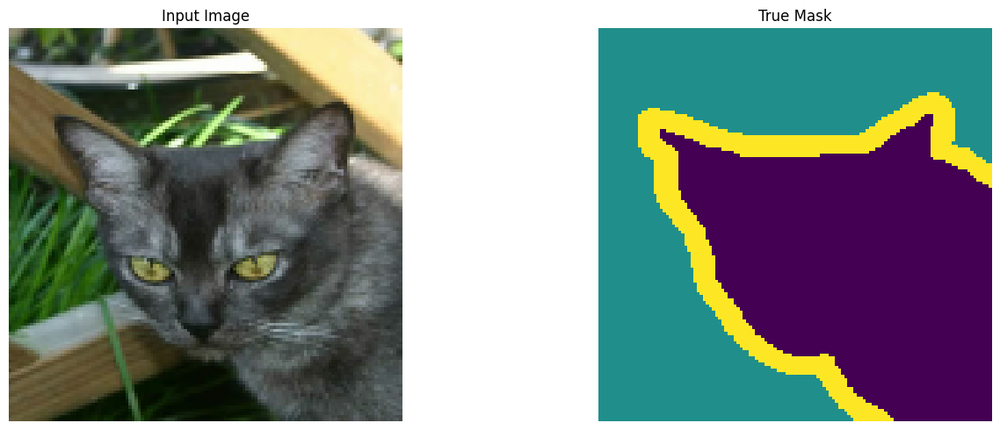

In [ ]:
# Display a sample from the dataset to verify preprocessing.
# This shows an input image alongside its segmentation mask.
for images, masks in train_dataset.take(1):
    sample_image, sample_mask = images[0], masks[0]
    display([sample_image, sample_mask])

Next, implement the `visualize_segmentation_overlay()` function to enhance visualization for segmentation results with colored overlays. This function creates a more intuitive three-panel display showing the original image, true mask overlay, and predicted mask overlay for easy visual comparison. While the `display()` function shows masks using the `viridis` colormap (with purple, yellow, and turquoise hues), this overlay function uses a custom color scheme with red for the pet, green for the border, and blue for the background. This approach provides a complementary view that highlights segmentation boundaries more clearly by overlaying the colored masks directly on the original image.

In [ ]:
# Function to visualize the segmentation results with colored overlays.
# Creates a three-panel display showing the original image, true mask overlay,
# and predicted mask overlay for easy visual comparison.
def visualize_segmentation_overlay(image, true_mask, pred_mask, alpha=0.5):
    """
    Create a visualization with the original image and segmentation overlay.
    """
    # Convert tensors to numpy arrays if needed.
    if isinstance(image, tf.Tensor):
        image = image.numpy()
    if isinstance(true_mask, tf.Tensor):
        true_mask = true_mask.numpy()
    if isinstance(pred_mask, tf.Tensor):
        pred_mask = pred_mask.numpy()

    # Create a figure with three panels.
    plt.figure(figsize=(18, 6))

    # Panel 1: Original image.
    plt.subplot(1, 3, 1)
    plt.title("Original Image")
    plt.imshow(image)
    plt.axis("off")

    # Panel 2: True mask overlay with color-coding.
    plt.subplot(1, 3, 2)
    plt.title("True Mask Overlay")
    plt.imshow(image)

    # Create a colormap for the mask: red for pet, green for border, and blue for background.
    mask_rgb = np.zeros((*true_mask.shape[0:2], 3))
    mask_rgb[true_mask[:, :, 0] == 0] = [1, 0, 0]  # Class "0" (pet) as red.
    mask_rgb[true_mask[:, :, 0] == 1] = [0, 1, 0]  # Class "1" (border) as green.
    mask_rgb[true_mask[:, :, 0] == 2] = [0, 0, 1]  # Class "2" (background) as blue.

    # Overlay the colored mask on the image with transparency.
    plt.imshow(mask_rgb, alpha=alpha)
    plt.axis("off")

    # Panel 3: Predicted mask overlay with the same color scheme.
    plt.subplot(1, 3, 3)
    plt.title("Predicted Mask Overlay")
    plt.imshow(image)

    # Create a colormap for the predicted mask using the same colors as that of the true mask.
    pred_mask_rgb = np.zeros((*pred_mask.shape[0:2], 3))
    pred_mask_rgb[pred_mask[:, :, 0] == 0] = [1, 0, 0]  # Class "0" (pet) as red.
    pred_mask_rgb[pred_mask[:, :, 0] == 1] = [0, 1, 0]  # Class "1" (border) as green.
    pred_mask_rgb[pred_mask[:, :, 0] == 2] = [0, 0, 1]  # Class "2" (background) as blue.

    # Overlay the colored predicted mask on the image with transparency.
    plt.imshow(pred_mask_rgb, alpha=alpha)
    plt.axis("off")

    plt.tight_layout()
    plt.show()

**Note:** This enhanced visualization function will be used later to provide more detailed views of our segmentation results in the sections "Visualization utilities for training" and "Model evaluation".

## Model architecture

Define the U-Net model architecture to be used for the image segmentation task.

### U-Net architecture

The [U-Net](https://lmb.informatik.uni-freiburg.de/people/ronneber/u-net/) architecture is particularly well-suited for biomedical image segmentation and has been widely adopted for various semantic segmentation tasks. It follows an encoder-decoder structure with skip connections.

1.   **Encoder (Downsampling Path):** Captures context and reduces spatial dimensions.
2.   **Decoder (Upsampling Path):** Enables precise localization and increases spatial dimensions.
3.   **Skip Connections:** Connect corresponding layers from the encoder to the decoder, helping preserve spatial information that might be lost during downsampling.

This work will use [MobileNetV2](https://arxiv.org/abs/1801.04381) as the encoder and a custom decoder with enhanced upsampling blocks. Using a pre-trained encoder simply implies that it does not need to be trained during the training process. By leveraging transfer learning with the pre-trained MobileNetV2, the model can benefit from features learned on a large dataset, allowing it to converge faster and achieve better performance even with limited training data.

### Enhanced U-Net

We are ready to define the U-Net model. Go ahead and implement the enhanced U-Net architecture with the modifications described above. The following implementation incorporates [MobileNetV2](https://arxiv.org/abs/1801.04381) as a pre-trained encoder for the U-Net model to extract features efficiently and adds custom upsampling blocks to create a more powerful segmentation model. MobileNetV2 is a lightweight and efficient Convolutional Neural Network (CNN) pre-trained on the ImageNet dataset. Extract intermediate features from specific layers that provide useful information at different scales.

In [ ]:
# Use MobileNetV2 as the encoder for our U-Net model.
# We leverage a pre-trained network to extract features efficiently.
# The model is loaded without the classification head ("include_top=False").
base_model = tf.keras.applications.MobileNetV2(
    input_shape=[128, 128, 3], include_top=False
)

# Define specific layers from the base model to use for skip connections.
# These layers capture features at different scales and detail levels.
layer_names = [
    "block_1_expand_relu",   # "64x64 pixels"
    "block_3_expand_relu",   # "32x32 pixels"
    "block_6_expand_relu",   # "16x16 pixels"
    "block_13_expand_relu",  # "8x8 pixels"
    "block_16_project",      # "4x4 pixels"
]

# Extract the output tensors from the specified layers.
base_model_outputs = [base_model.get_layer(name).output for name in layer_names]

# Create the feature extraction model using the base model's input and our selected outputs.
encoder = Model(inputs=base_model.input, outputs=base_model_outputs)
encoder.trainable = False  # Freeze the encoder weights during training.

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


The architecture relies on two key convolutional layer types shown below. Refer to [this](https://developers.google.com/machine-learning/practica/image-classification/convolutional-neural-networks) article by Google to learn more about CNNs.

1.   **`Conv2D` Layers:** Perform spatial convolution over images, extracting features by applying learned filters. In the encoder path, these layers progressively reduce spatial dimensions while increasing feature depth, helping the network learn hierarchical features.
2.   **`Conv2DTranspose` Layers:** Perform the reverse operation (mathematical inverse) of `Conv2D` or convolution, sometimes called deconvolution. These layers are essential for the decoder path, where they upsample feature maps to restore spatial resolution while decreasing feature depth. This allows the network to generate the full-resolution segmentation mask where each pixel is assigned a class. Learn more about the transposed convolution operation [here](https://arxiv.org/abs/1603.07285).

Next, define the upsampling blocks for the decoder. The `upsample_block()` function creates a sequential block that performs transposed convolution to upsample feature maps, helping the model reconstruct detailed segmentation masks. Batch normalization stabilizes training, dropout reduces overfitting, and the Rectified Linear Unit (ReLU) activation function introduces non-linearity.

In [ ]:
# Enhanced decoder blocks with batch normalization and optional dropout.
# These blocks upsample feature maps and help the model learn to reconstruct detailed segmentation masks.
def upsample_block(filters, size, apply_dropout=False):
    initializer = tf.random_normal_initializer(0., 0.02)

    result = tf.keras.Sequential()
    # Transposed convolution for upsampling feature maps.
    result.add(Conv2DTranspose(
        filters, size, strides=2, padding="same",
        kernel_initializer=initializer, use_bias=False
    ))

    # Apply batch normalization to stabilize training.
    result.add(BatchNormalization())

    # Add dropout for regularization when specified.
    if apply_dropout:
        result.add(Dropout(0.5))

    # Apply ReLU activation function for non-linearity.
    result.add(ReLU())

    return result

Go ahead and define the upsampling stack for the decoder with upsampling blocks of different filter sizes. The first blocks have more filters and include dropout for regularization. Later blocks have fewer filters as they produce higher-resolution feature maps.

In [ ]:
# Define a stack of upsampling blocks with different filter sizes.
# The first blocks have more filters and include dropout for regularization.
# Later blocks have fewer filters as they produce higher-resolution feature maps.
up_stack = [
    upsample_block(512, 3, apply_dropout=True),   # "4x4 pixels" -> "8x8 pixels"
    upsample_block(256, 3, apply_dropout=True),   # "8x8 pixels" -> "16x16 pixels"
    upsample_block(128, 3),                       # "16x16 pixels" -> "32x32 pixels"
    upsample_block(64, 3),                        # "32x32 pixels" -> "64x64 pixels"
]

Next, implement the complete U-Net model with the encoder-decoder architecture and skip connections. Define the `unet_model()` function which creates a modified U-Net with several enhancements listed below. This architecture is particularly well-suited for semantic segmentation tasks due to its ability to precisely localize features through skip connections while maintaining contextual information.It:

1.   Uses MobileNetV2 as an encoder for efficient feature extraction.
2.   Adds skip connections between the encoder and the decoder to preserve spatial information.
3.   Includes an additional convolution after each concatenation to refine features.

The model outputs raw logits (unnormalized prediction scores) for each pixel across all output classes, which will later be converted to probabilities using softmax during the prediction phase.

In [ ]:
# Define the full U-Net model with encoder-decoder architecture and skip connections.
# This function creates and returns the assembled model.
def unet_model():
   # Define input layer for RGB images of size "128x128 pixels".
   inputs = Input(shape=[128, 128, 3])

   # Encoder (downsampling) - use pre-trained MobileNetV2 for feature extraction.
   skips = encoder(inputs)
   x = skips[-1]  # Start with the bottleneck features.
   skips = reversed(skips[:-1])  # Reverse skip connections for the decoder.

   # Decoder (upsampling) with skip connections from the encoder.
   for up, skip in zip(up_stack, skips):
       x = up(x)  # Upsample the current features.

       # Add residual connection when shapes match.
       if x.shape[1:3] == skip.shape[1:3]:
           x_res = Conv2D(skip.shape[-1], 1, padding="same")(x)
           skip = Add()([skip, x_res])

       # Concatenate upsampled features with the corresponding skip connection.
       concat = Concatenate()
       x = concat([x, skip])

       # Additional convolution to refine the concatenated features.
       x = Conv2D(x.shape[-1] // 2, 3, padding="same", activation="relu")(x)

   # Final output layer that produces logits for each class ("OUTPUT_CLASSES").
   # Upsampling from "64x64 pixels" to "128x128 pixels" to match the original image dimensions.
   last = Conv2DTranspose(
       filters=OUTPUT_CLASSES, kernel_size=3, strides=2,
       padding="same"
   )  # "64x64 pixels" -> "128x128 pixels"

   x = last(x)

   return Model(inputs=inputs, outputs=x)

Finally, create the model within the GPU distribution strategy (`MirroredStrategy`) scope. This ensures that the model is properly sharded across available GPU cores for efficient training.


In [ ]:
# Create the model within the GPU distribution strategy scope.
# This ensures that the model is properly sharded across available GPU devices for efficient training.
# This constructs the complete U-Net architecture with all layers and connections.
with strategy.scope():
  model = unet_model()

## Loss functions and metrics

For segmentation tasks, choosing an appropriate loss function is crucial. While cross-entropy is commonly used for multiclass classification problems like pixel-wise segmentation, the Dice loss often performs better for segmentation specifically. The Dice loss measures the overlap between the predicted and ground truth segmentation masks. A perfect overlap would result in a Dice coefficient of `1` and a loss of `0`. In this work, we will implement both and combine them. Learn more about the Dice loss [here](https://arxiv.org/abs/1606.04797).

In [ ]:
# Dice loss function for segmentation tasks.
# This loss focuses on the overlap between the predicted and ground truth masks.
# A perfect overlap would result in a Dice coefficient of "1" and a loss of "0".
def dice_loss(y_true, y_pred, smooth=1e-6):
    # Convert the predictions to probability distribution.
    y_pred = tf.nn.softmax(y_pred, axis=-1)

    # Convert ground truth to one-hot encoding.
    y_true = tf.one_hot(tf.cast(tf.squeeze(y_true, axis=-1), tf.int32), depth=OUTPUT_CLASSES)

    # Calculate the Dice coefficient: "2 * intersection / (sum of areas)"".
    numerator = 2 * tf.reduce_sum(y_true * y_pred, axis=(1, 2)) + smooth
    denominator = tf.reduce_sum(y_true, axis=(1, 2)) + tf.reduce_sum(y_pred, axis=(1, 2)) + smooth

    # Dice loss is "1" minus the Dice coefficient.
    return 1 - tf.reduce_mean(numerator / denominator)

Next, create a combined loss function that incorporates both categorical cross-entropy (`tf.keras.losses.sparse_categorical_crossentropy`) and Dice loss. The combined loss function adds both losses together, which helps the model optimize for both pixel-wise accuracy (from cross-entropy) and region-based overlap (from Dice loss). This approach often leads to better segmentation results than using either loss function alone. Set the `from_logits` parameter to `True`, since the model outputs raw, unnormalized scores rather than probabilities. This allows for more numerically stable gradient computation during training and is appropriate since the labels are scalar integers representing class indices for each pixel rather than one-hot encoded vectors.

**Note:** While TensorFlow offers direct computation of [Dice loss](https://www.tensorflow.org/api_docs/python/tf/keras/losses/Dice), we choose to implement it manually for customization flexibility, explicit understanding of the calculation process, and seamless integration with the combined loss function. This approach also ensures greater control over handling the multi-class nature of the image segmentation task.

In [ ]:
# Combined loss function using both cross-entropy and Dice loss.
# This approach benefits from cross-entropy's pixel-wise accuracy and
# Dice loss's focus on region-based overlap.
def combined_loss(y_true, y_pred):
    # Convert ground truth to class indices.
    y_true_class = tf.cast(tf.squeeze(y_true, axis=-1), tf.int32)

    # Standard cross-entropy loss for pixel-wise classification.
    ce_loss = tf.keras.losses.sparse_categorical_crossentropy(
        y_true_class, y_pred, from_logits=True
    )

    # Calculate Dice loss for region-based optimization.
    dice = dice_loss(y_true, y_pred)

    # Return the sum of both losses.
    return ce_loss + dice

To ensure proper distribution of gradients and optimization, compile the model with Adam optimizer, combined loss function, and accuracy metric within the GPU strategy scope. This prepares the model for training by defining how it should be updated based on the loss and how performance should be measured.

In [ ]:
# Compile the model with Adam optimizer, combined loss function, and accuracy metric
# within the GPU strategy scope. This ensures proper distribution of gradients and optimization.

# This prepares the model for training by defining how it should be updated
# based on the loss and how performance should be measured.
with strategy.scope():
  model.compile(
      optimizer="adam",
      loss=combined_loss,
      metrics=["accuracy"]
  )

Visualize the model architecture to better understand the network structure.

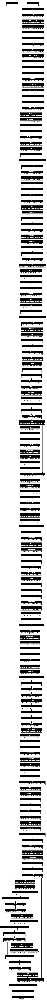

In [ ]:
# Visualize the model architecture to better understand the network structure.
# This generates a graphical representation of the layers and connections.
tf.keras.utils.plot_model(
    model,
    show_shapes=True,         # Display shape information.
    expand_nested=True,       # Expand nested models.
    dpi=64                    # Set the resolution.
)

## Visualization utilities for training

To monitor the training progress, we will need functions to visualize the model's predictions. First, create the utility function `create_mask()`, which takes the model's prediction (which contains logits for each class) and converts it to a displayable mask. The function extracts the most likely class (class with the highest probability) for each pixel by taking the `argmax` along the class dimension.

In [ ]:
# Function to convert model predictions (logits) into segmentation masks.
# This extracts the most likely class for each pixel by taking the "argmax" along the class dimension.
def create_mask(pred_mask):
    """Convert the model prediction to a displayable mask."""
    # Get the class with the highest probability for each pixel.
    pred_mask = tf.argmax(pred_mask, axis=-1)
    # Add a channel dimension to make it compatible with the visualization function.
    pred_mask = pred_mask[..., tf.newaxis]
    return pred_mask

Next, create a callback to visualize the model's predictions during training. The class `DisplayCallback` shows predictions on a sample image after every 5 epochs, allowing visual tracking of how the model’s segmentation ability improves during training.

In [ ]:
# Custom callback to visualize model predictions during training.
# This helps track the model's progress in learning to segment images.
class DisplayCallback(tf.keras.callbacks.Callback):
    def __init__(self, sample_image, sample_mask):
        self.sample_image = sample_image
        self.sample_mask = sample_mask

    def on_epoch_end(self, epoch, logs=None):
        # Show a prediction after every few epochs.
        if (epoch + 1) % 5 == 0:  # Change frequency as needed.
            prediction = self.model.predict(tf.expand_dims(self.sample_image, 0))
            pred_mask = create_mask(prediction)

            print(f"\nSample prediction after epoch {epoch+1}")
            display([self.sample_image, self.sample_mask, pred_mask[0]])

Select a sample image from the test dataset for the callback.

In [ ]:
# Get a sample from the test dataset to visualize predictions during training.
# This will help us visually track the model's progress.
for image, mask in test_dataset.take(1):
    sample_image, sample_mask = image[0], mask[0]

Now, set up all of the callbacks to monitor and control the training process. These will help with visualization, logging, model saving, and early stopping. The callbacks include the following.

1.   The custom `DisplayCallback` for visualization.
2.   `TensorBoard` for monitoring the training metrics.
2.   `ModelCheckpoint` to save the best model based on the validation loss.
2.   `EarlyStopping` to prevent overfitting by stopping training when the validation loss stops improving.

In [ ]:
# Create a comprehensive set of callbacks to monitor and control training.
# These will help with visualization, logging, model saving, and early stopping.
callbacks = [
    # Visualize predictions periodically during training.
    DisplayCallback(sample_image, sample_mask),

    # Log metrics for visualization in TensorBoard.
    tf.keras.callbacks.TensorBoard(log_dir="logs/segmentation"),

    # Save the best model based on validation loss.
    tf.keras.callbacks.ModelCheckpoint(
        filepath="segmentation_model.h5",
        save_best_only=True,
        monitor="val_loss"
    ),

    # Stop the training early if the validation loss stops improving.
    tf.keras.callbacks.EarlyStopping(
        monitor="val_loss", # Monitor the validation loss.
        patience=5, # The number of epochs with no improvement after which the training will be stopped.
        restore_best_weights=True # Restore model weights from the epoch with the best value of the validation loss.
    )
]

Visualize predictions before training to establish a baseline. This will help in understanding how the untrained model performs and aid in comparison with the trained one.

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
Model prediction before training:


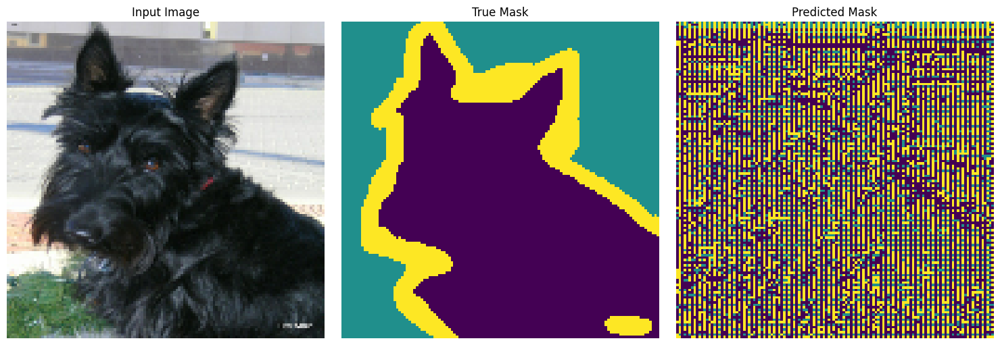

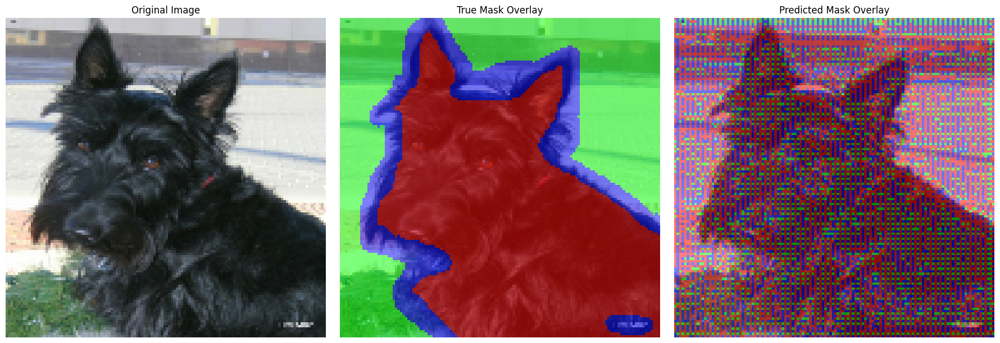

In [ ]:
# Visualize predictions before training to establish a baseline.
# This helps understand how the untrained model performs.
def show_initial_prediction():
    """Show what the model predicts before any training."""
    # Generate a prediction using the untrained model.
    prediction = model.predict(tf.expand_dims(sample_image, 0))
    pred_mask = create_mask(prediction)

    # Display the input image, true mask, and initial prediction.
    print("Model prediction before training:")
    display([sample_image, sample_mask, pred_mask[0]])

    # Also show the overlay visualization.
    visualize_segmentation_overlay(sample_image, sample_mask, pred_mask[0])

# Check what the model predicts before training.
 show_initial_prediction()

## Model training

Now that everything is set up, go ahead and train the model using the prepared datasets and callbacks. This process will optimize the model to minimize the defined loss function.

**Note:** For simplicity, this tutorial makes use of the dataset's predefined test split as the validation data during training. In many Machine Learning (ML) workflows, one would typically find three separate splits (train, validation, and test), but with the Oxford-IIIT Pet dataset's size, we use the two-split approach to preserve sufficient training data.

Epoch 1/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step - accuracy: 0.6679 - loss: 1.3202

28/28 ━━━━━━━━━━━━━━━━━━━━ 24s 322ms/step - accuracy: 0.6718 - loss: 1.3086 - val_accuracy: 0.8471 - val_loss: 1.2741
Epoch 2/50
 1/28 ━━━━━━━━━━━━━━━━━━━━ 2:10 5s/step - accuracy: 0.8715 - loss: 0.6596

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


28/28 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step - accuracy: 0.8715 - loss: 0.6596 - val_accuracy: 0.8516 - val_loss: 1.1114
Epoch 3/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - accuracy: 0.8738 - loss: 0.6199

28/28 ━━━━━━━━━━━━━━━━━━━━ 6s 216ms/step - accuracy: 0.8740 - loss: 0.6191 - val_accuracy: 0.8875 - val_loss: 0.6131
Epoch 4/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - accuracy: 0.8924 - loss: 0.5313 - val_accuracy: 0.8766 - val_loss: 0.6953
Epoch 5/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step

Sample prediction after epoch 5


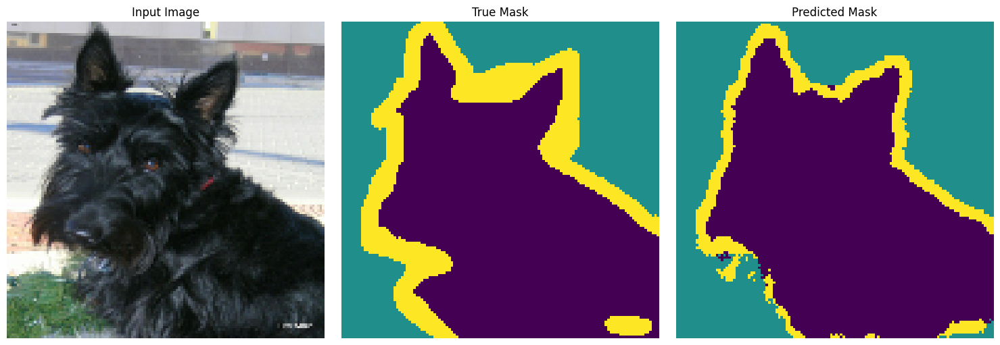

28/28 ━━━━━━━━━━━━━━━━━━━━ 9s 232ms/step - accuracy: 0.8938 - loss: 0.5224 - val_accuracy: 0.8959 - val_loss: 0.5371
Epoch 6/50
 1/28 ━━━━━━━━━━━━━━━━━━━━ 2s 106ms/step - accuracy: 0.8932 - loss: 0.5021

28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - accuracy: 0.8932 - loss: 0.5021 - val_accuracy: 0.8995 - val_loss: 0.5098
Epoch 7/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 5s 188ms/step - accuracy: 0.8959 - loss: 0.5089 - val_accuracy: 0.8795 - val_loss: 0.6164
Epoch 8/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - accuracy: 0.8872 - loss: 0.5474 - val_accuracy: 0.8923 - val_loss: 0.5179
Epoch 9/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - accuracy: 0.9007 - loss: 0.4842

28/28 ━━━━━━━━━━━━━━━━━━━━ 6s 221ms/step - accuracy: 0.9008 - loss: 0.4840 - val_accuracy: 0.9022 - val_loss: 0.4995
Epoch 10/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step

Sample prediction after epoch 10


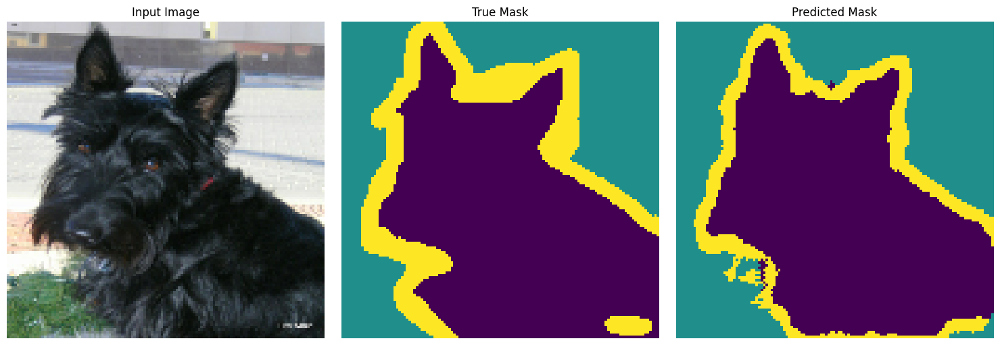

28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 87ms/step - accuracy: 0.9049 - loss: 0.4676 - val_accuracy: 0.9034 - val_loss: 0.4877
Epoch 11/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 5s 189ms/step - accuracy: 0.9057 - loss: 0.4661 - val_accuracy: 0.9027 - val_loss: 0.4888
Epoch 12/50
 1/28 ━━━━━━━━━━━━━━━━━━━━ 3s 116ms/step - accuracy: 0.9058 - loss: 0.4593

28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 73ms/step - accuracy: 0.9058 - loss: 0.4593 - val_accuracy: 0.9061 - val_loss: 0.4646
Epoch 13/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 5s 189ms/step - accuracy: 0.9090 - loss: 0.4483 - val_accuracy: 0.9052 - val_loss: 0.4665
Epoch 14/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 43ms/step - accuracy: 0.9153 - loss: 0.4194 - val_accuracy: 0.9009 - val_loss: 0.4851
Epoch 15/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step

Sample prediction after epoch 15


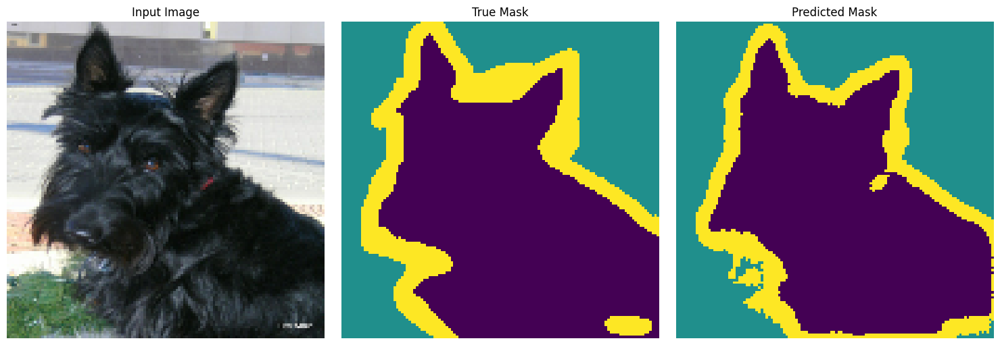

28/28 ━━━━━━━━━━━━━━━━━━━━ 6s 207ms/step - accuracy: 0.9107 - loss: 0.4390 - val_accuracy: 0.9017 - val_loss: 0.4857
Epoch 16/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - accuracy: 0.9190 - loss: 0.4015 - val_accuracy: 0.8929 - val_loss: 0.5211
Epoch 17/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - accuracy: 0.9118 - loss: 0.4362

28/28 ━━━━━━━━━━━━━━━━━━━━ 11s 289ms/step - accuracy: 0.9118 - loss: 0.4362 - val_accuracy: 0.9087 - val_loss: 0.4530
Epoch 18/50
 1/28 ━━━━━━━━━━━━━━━━━━━━ 2s 106ms/step - accuracy: 0.9067 - loss: 0.4558

28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 68ms/step - accuracy: 0.9067 - loss: 0.4558 - val_accuracy: 0.9110 - val_loss: 0.4384
Epoch 19/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 10s 347ms/step - accuracy: 0.9121 - loss: 0.4342 - val_accuracy: 0.9082 - val_loss: 0.4525
Epoch 20/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step

Sample prediction after epoch 20


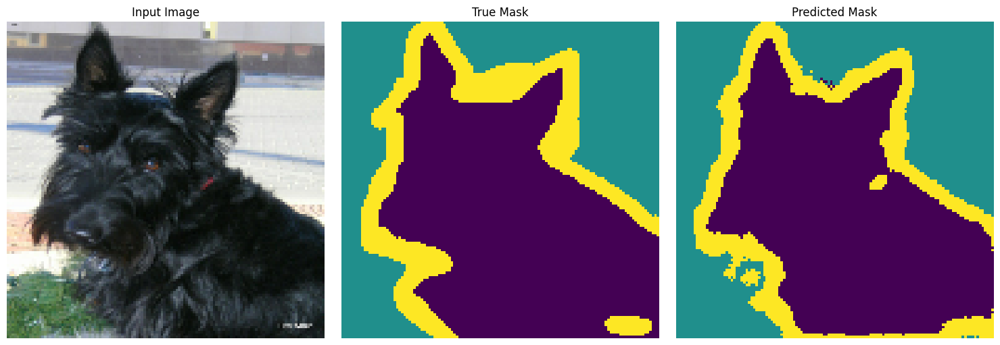

28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step - accuracy: 0.9062 - loss: 0.4521 - val_accuracy: 0.9094 - val_loss: 0.4437
Epoch 21/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 0s 148ms/step - accuracy: 0.9133 - loss: 0.4273

28/28 ━━━━━━━━━━━━━━━━━━━━ 6s 215ms/step - accuracy: 0.9134 - loss: 0.4270 - val_accuracy: 0.9152 - val_loss: 0.4248
Epoch 22/50
 1/28 ━━━━━━━━━━━━━━━━━━━━ 2s 106ms/step - accuracy: 0.9247 - loss: 0.3659

28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 69ms/step - accuracy: 0.9247 - loss: 0.3659 - val_accuracy: 0.9170 - val_loss: 0.4117
Epoch 23/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 5s 187ms/step - accuracy: 0.9144 - loss: 0.4231 - val_accuracy: 0.9079 - val_loss: 0.4407
Epoch 24/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 42ms/step - accuracy: 0.9093 - loss: 0.4303 - val_accuracy: 0.9043 - val_loss: 0.4573
Epoch 25/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step

Sample prediction after epoch 25


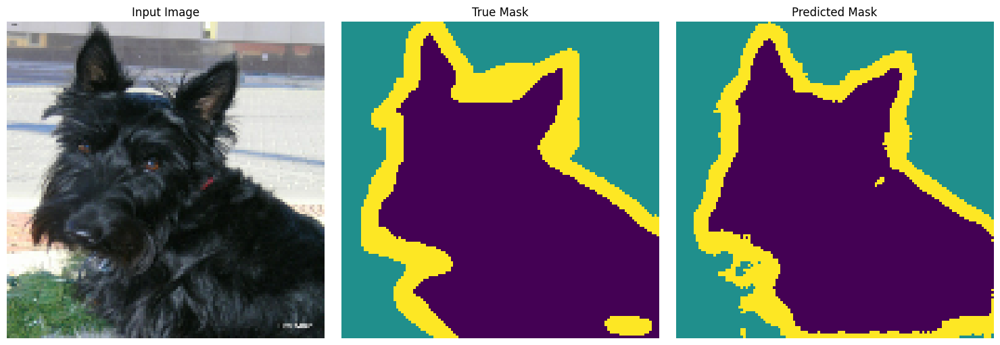

28/28 ━━━━━━━━━━━━━━━━━━━━ 6s 202ms/step - accuracy: 0.9190 - loss: 0.4018 - val_accuracy: 0.9126 - val_loss: 0.4302
Epoch 26/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - accuracy: 0.9202 - loss: 0.3938 - val_accuracy: 0.9125 - val_loss: 0.4298
Epoch 27/50
28/28 ━━━━━━━━━━━━━━━━━━━━ 8s 186ms/step - accuracy: 0.9189 - loss: 0.4012 - val_accuracy: 0.9122 - val_loss: 0.4319


In [ ]:
# Set the maximum number of training epochs.
# The actual number may be less due to early stopping.
EPOCHS = 50

# Train the model using the prepared datasets and callbacks.
# This process will optimize the model to minimize the defined loss function.
history = model.fit(
    train_dataset,
    epochs=EPOCHS,
    steps_per_epoch=STEPS_PER_EPOCH,
    validation_steps=VALIDATION_STEPS,
    validation_data=test_dataset,
    callbacks=callbacks
)

## Analyzing training results

Visualize and analyze the model's performance after training. First, launch TensorBoard to see the metrics that were logged during training. TensorBoard provides an interactive interface for exploring training and validation metrics over time with additional features like zooming and comparing runs.

In [ ]:
# Launch TensorBoard to visualize the training metrics.
%load_ext tensorboard
%tensorboard --logdir=logs/segmentation

<IPython.core.display.Javascript object>

While TensorBoard offers interactive exploration, we should also create specific plots of the training and validation performance to evaluate the model's learning progression and gauge how well the model learned to segment images. Plot the accuracy and loss of the model for the training and validation data and investigate if we are overfitting or underfitting the data. The `history` object contains information about the training process that we will leverage.

In [ ]:
 # Extract the training history.
history_dict = history.history

# Explore the information about the training process available in the "history" object.
history_dict.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
# Training accuracy.
acc = history_dict["accuracy"]

# Validation accuracy.
val_acc = history_dict["val_accuracy"]

# Training loss.
loss = history_dict["loss"]

# Validation loss.
val_loss = history_dict["val_loss"]

# Number of epochs used for training.
epochs = range(1, len(acc) + 1)

Plot the training and validation accuracy of the model.

In [ ]:
# Function to plot the training and validation accuracy of the model.
def plot_accuracy(history):
  # Plot the training & validation accuracy values.
  plt.figure(figsize=(12, 4))
  plt.plot(epochs, acc, label="accuracy")
  plt.plot(epochs, val_acc, label="val_accuracy")
  plt.title("Model Accuracy")
  plt.xlabel("Epoch")
  plt.ylabel("Accuracy")
  plt.legend(["Train", "Validation"], loc="upper left")
  plt.grid(True)
  plt.show()

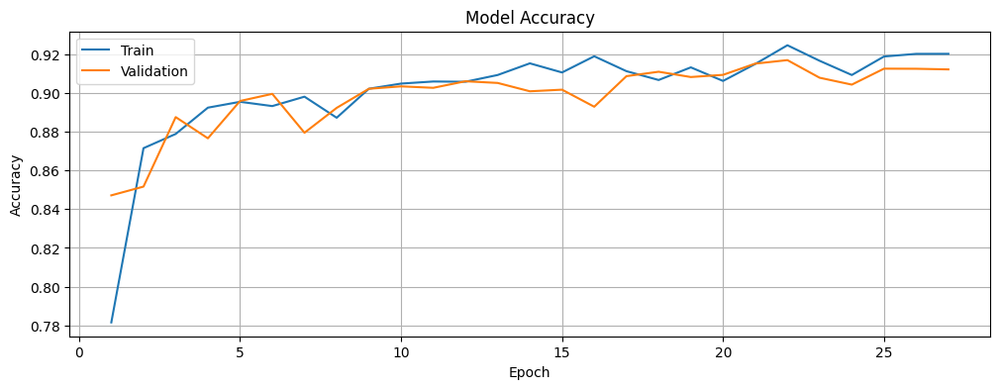

In [ ]:
# Plot the training and validation accuracy of the model.
plot_accuracy(history)

Plot the training and validation loss of the model.

In [ ]:
# Function to plot the training and validation loss of the model.
def plot_loss(history):
  # Plot the training & validation loss values.
  plt.figure(figsize=(12, 4))
  plt.plot(epochs, loss, label="loss")
  plt.plot(epochs, val_loss, label="val_loss")
  plt.title("Model Loss")
  plt.xlabel("Epoch")
  plt.ylabel("Loss")
  plt.legend(["Train", "Validation"], loc="upper left")
  plt.grid(True)
  plt.show()

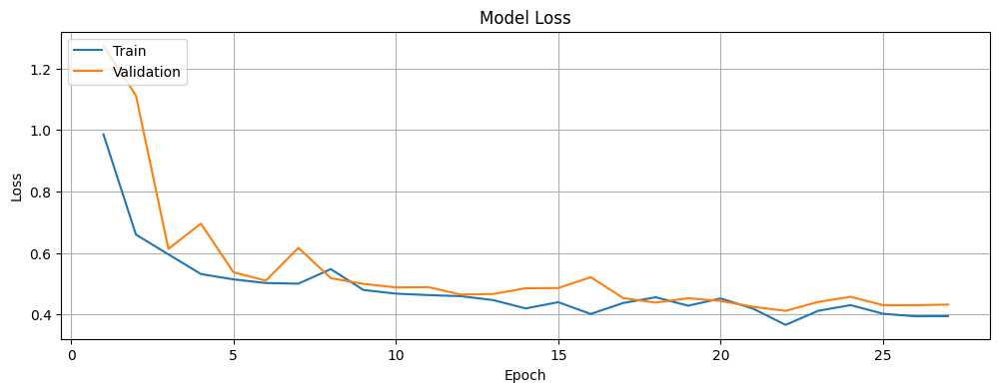

In [ ]:
# Plot the training and validation loss of the model.
plot_loss(history)

## Model evaluation

Evaluate the trained model on the test dataset to measure its performance in terms of the loss and accuracy.

In [ ]:
# Evaluate the model on the test dataset to measure its performance.
# This returns the loss and accuracy on unseen data.
eval_results = model.evaluate(test_dataset)
print(f"Test loss: {eval_results[0]}, Test accuracy: {eval_results[1]}")

29/29 ━━━━━━━━━━━━━━━━━━━━ 4s 111ms/step - accuracy: 0.9148 - loss: 0.4225
Test loss: 0.42330583930015564, Test accuracy: 0.9148234724998474


Next, create functions to visualize the model's predictions on test images. The `show_predictions()` function achieves this by displaying predictions for a few images from a dataset, showing both the original visualization and an enhanced overlay visualization.

In [ ]:
# Function to visualize model predictions on multiple images from a dataset.
def show_predictions(dataset, num=3):
    """Show predictions for a few images from the dataset."""
    if dataset:
        for image, mask in dataset.take(num):
            pred_mask = model.predict(image)

            for i in range(min(num, image.shape[0])):
                # Original visualization with the input, true mask, and predicted mask.
                display([image[i], mask[i], create_mask(pred_mask)[i]])

                # Enhanced overlay visualization for better interpretation.
                visualize_segmentation_overlay(image[i], mask[i], create_mask(pred_mask)[i])

Go ahead and visualize the predictions on the test data. Display the original image, true mask, and predicted mask for each image.

4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 40ms/step


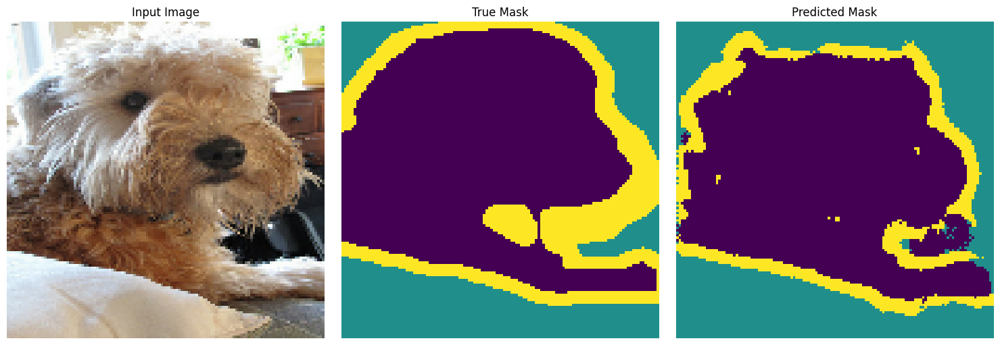

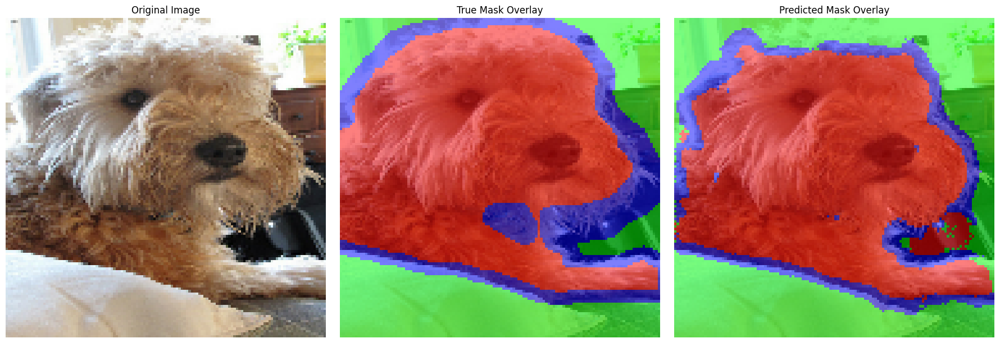

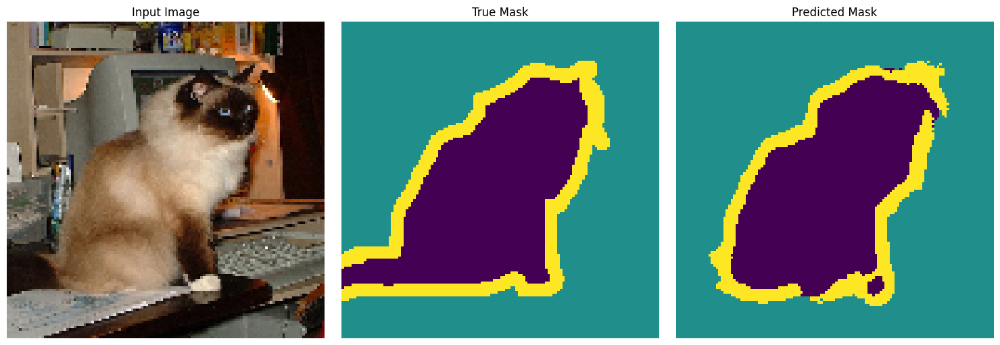

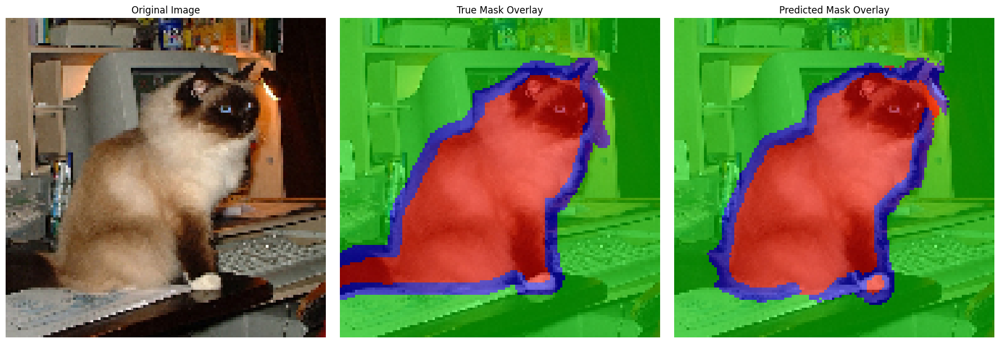

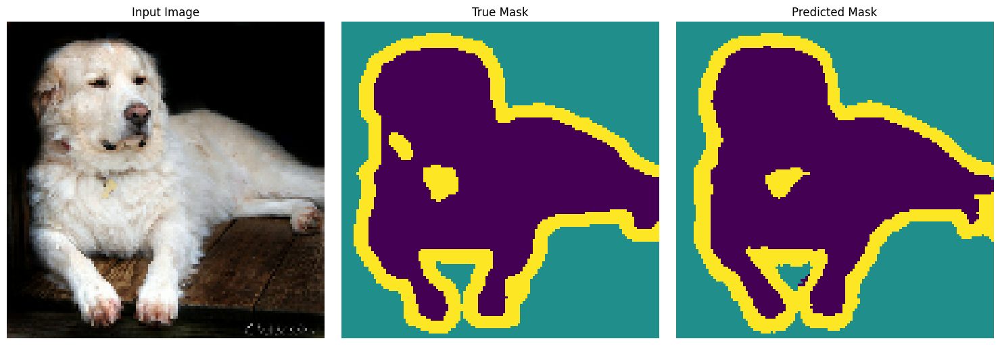

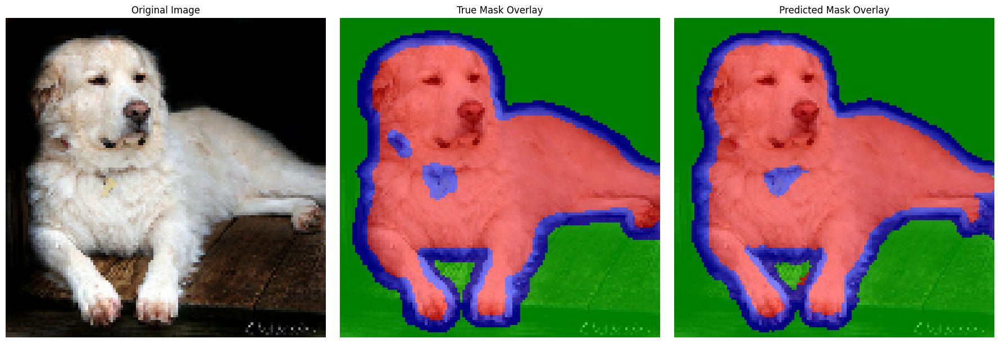

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


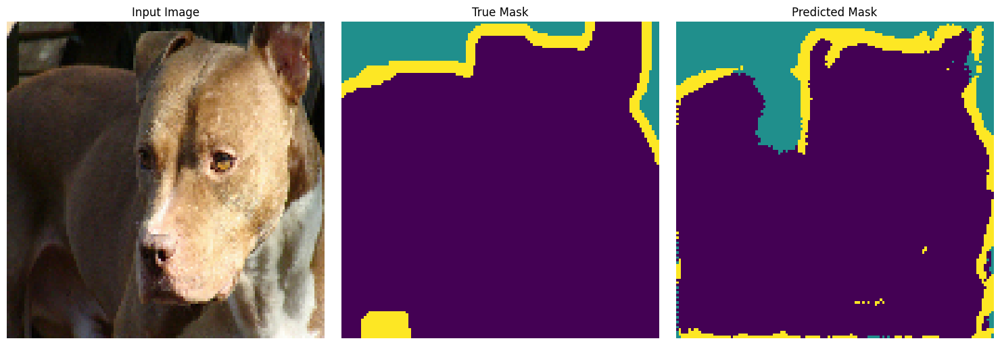

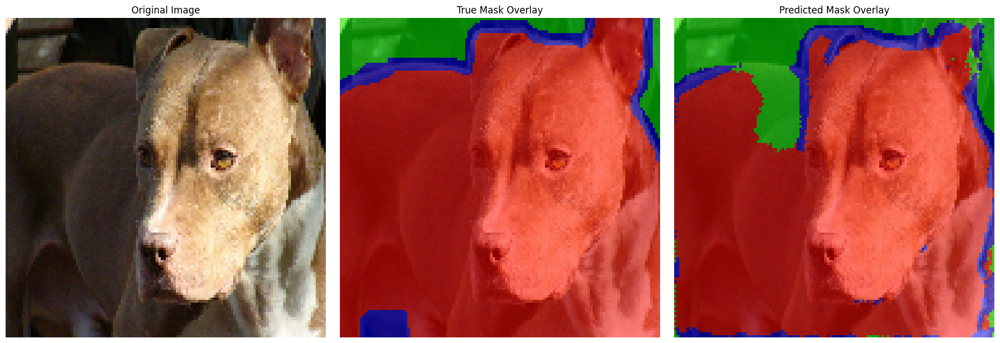

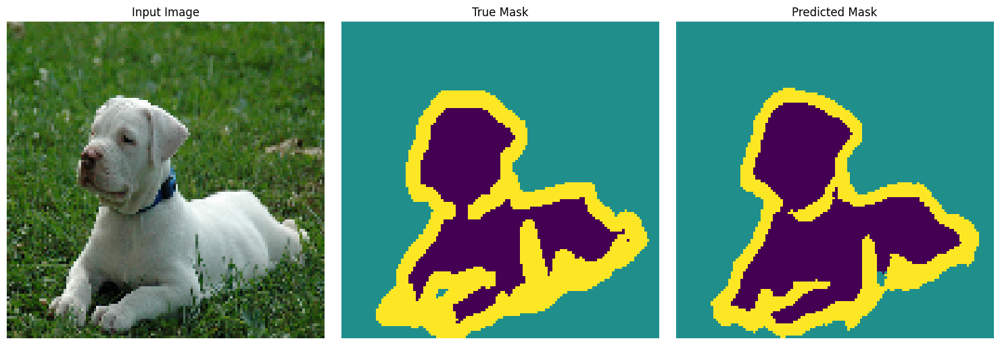

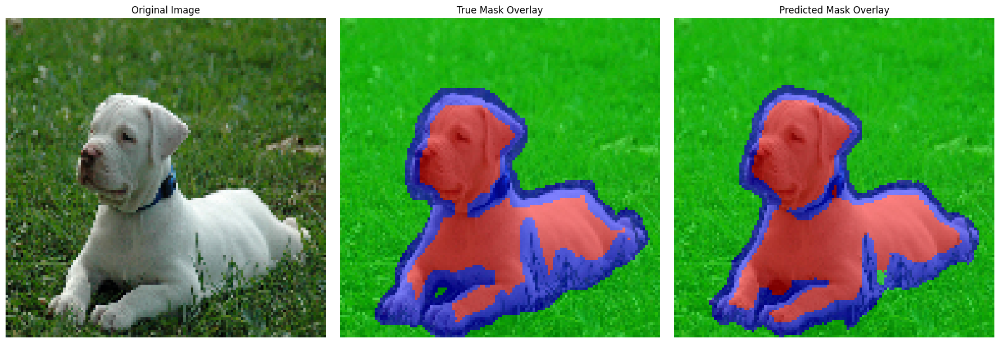

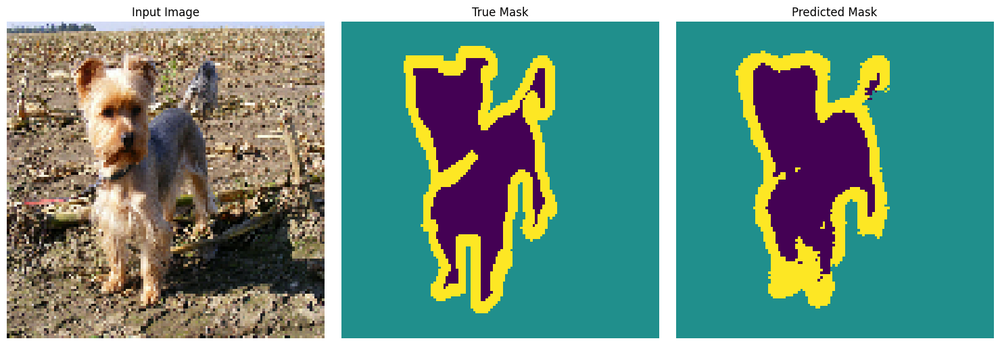

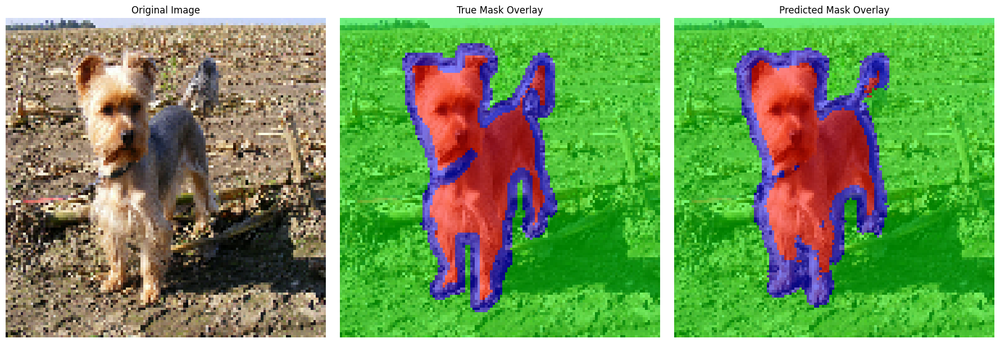

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


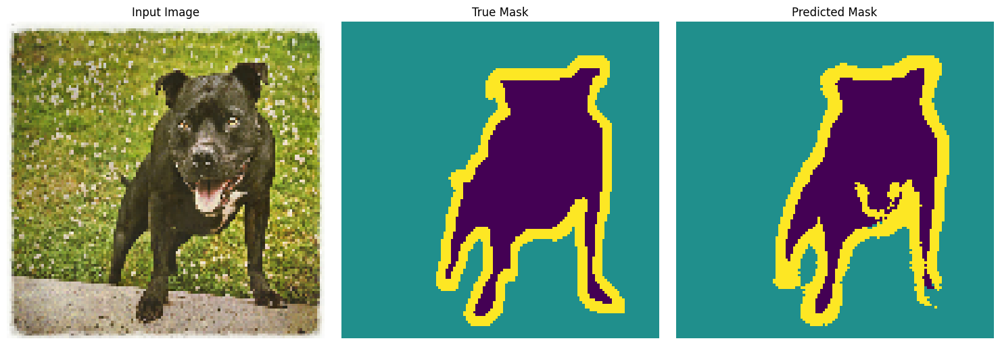

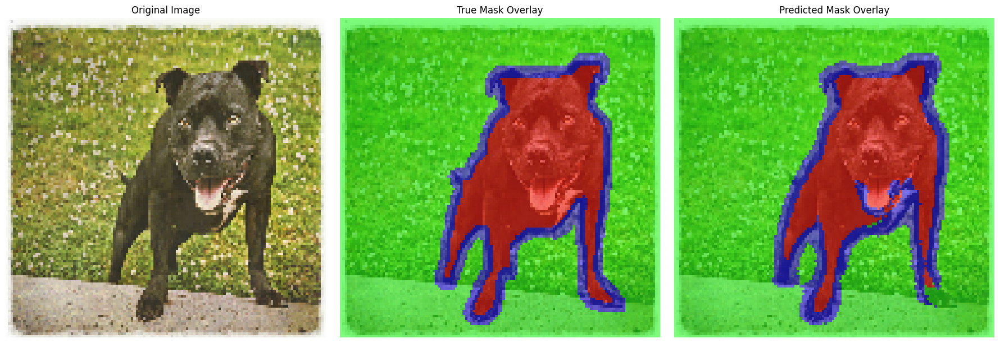

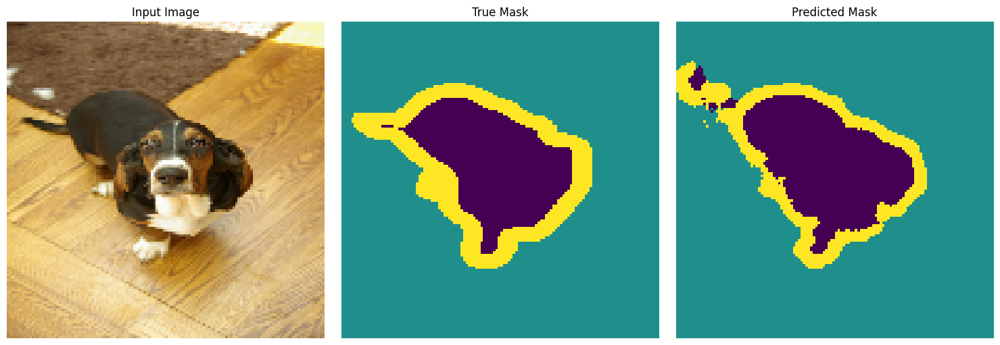

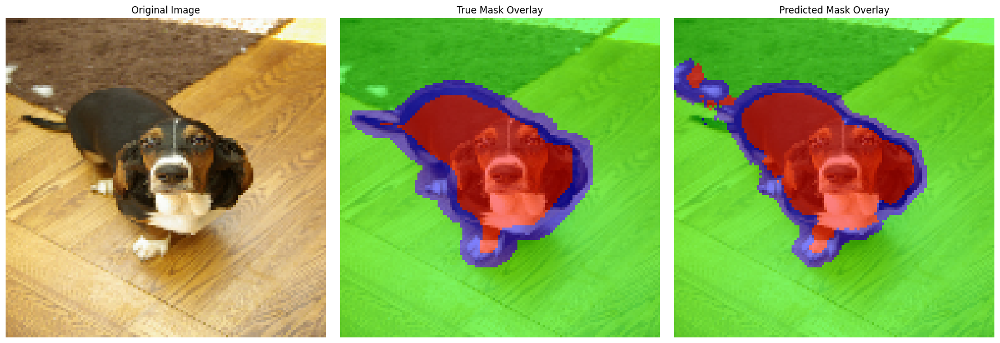

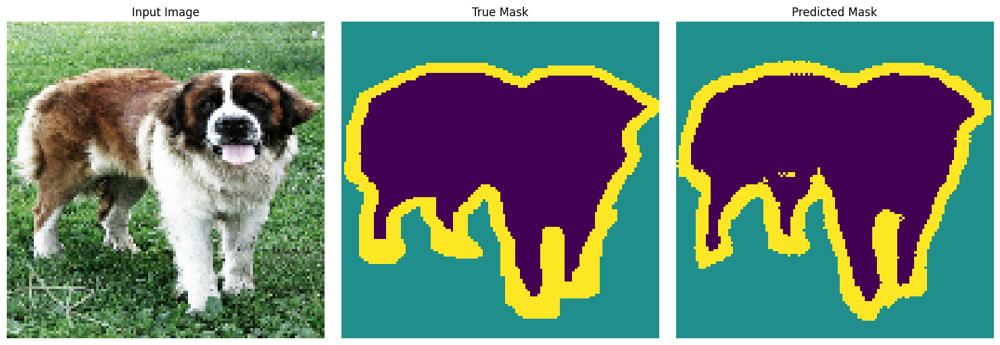

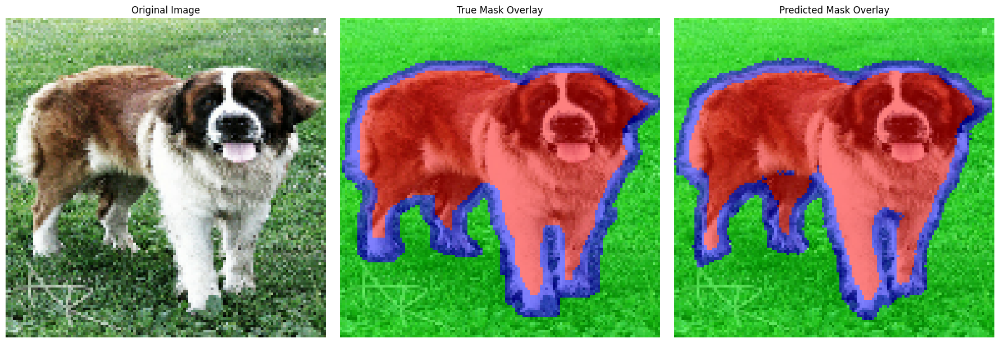

In [ ]:
# Show predictions on the test data to qualitatively evaluate the model's performance.
# This will display several examples with the original image, true mask, and predicted mask.
show_predictions(test_dataset)

Next, test the model's segmentation predictions with the test set. Create a probability model that applies softmax to the model's outputs, making the predictions easier to interpret as class probabilities. The prediction is executed inside the `MirroredStrategy` scope to ensure proper utilization of the GPU resources for inference.

In [ ]:
# Define the probability model within the GPU strategy scope.
# This ensures that inference will utilize the GPU resources efficiently.
with strategy.scope():
    # Create a probability model by adding a Softmax layer to the trained model.
    # This converts the logits output to class probabilities for easier interpretation.
    probability_model = tf.keras.Sequential([model, Softmax()])

Define a function to generate the segmentation predictions with probabilities. This allows examining the confidence of the model's predictions for each pixel.

In [ ]:
# Define a function to generate segmentation predictions with probabilities.
# This allows us to examine the confidence of our model's predictions for each pixel.
def predict_segmentation(image_batch):
    """Get probability-based predictions for a batch of images."""
    return probability_model.predict(image_batch)

Go ahead and test the probability model on a sample from the test dataset to verify that it produces the expected probability distributions. The prediction shape should match the expected output dimensions with a probability for each of the three classes (pet, border, and background) at each pixel location. The sample probability distribution exhibits the model's confidence in its classification at a specific pixel.

In [ ]:
# Test the probability model on a sample from the test dataset.
# This shows how confident the model is about its class predictions for each pixel.
for images, masks in test_dataset.take(1):
    sample_predictions = predict_segmentation(images)
    print("Predictions shape:", sample_predictions.shape)
    # Display the predicted class probabilities for a specific pixel.
    print("Sample prediction probability distribution:", sample_predictions[0, 50, 50])

4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step
Predictions shape: (128, 128, 128, 3)
Sample prediction probability distribution: [0.04907 0.2062  0.7446 ]


### Advanced evaluation metrics

For a more comprehensive evaluation of our segmentation model, calculate the Intersection over Union (IoU) metric, which is a standard evaluation metric for segmentation tasks. The `calculate_iou()` function computes the IoU for each class by measuring the overlap between the predicted and ground truth masks, providing a more rigorous evaluation than simple accuracy. IoU is defined as the intersection divided by the union of the predicted and ground truth masks.

In [ ]:
# Calculate the IoU metrics for each class.
# IoU measures the overlap between predicted and ground truth masks,
# providing a more rigorous evaluation than simple accuracy.
def calculate_iou(y_true, y_pred):
    """Calculate the IoU for each class."""
    class_ious = []

    # Convert the prediction to class indices.
    y_pred = tf.argmax(y_pred, axis=-1)
    y_true = tf.squeeze(y_true, axis=-1)

    # Calculate the IoU for each class.
    for class_id in range(OUTPUT_CLASSES):
        # Create binary masks for this class.
        true_mask = tf.cast(tf.equal(y_true, class_id), tf.float32)
        pred_mask = tf.cast(tf.equal(y_pred, class_id), tf.float32)

        # Calculate intersection and union.
        intersection = tf.reduce_sum(true_mask * pred_mask)
        union = tf.reduce_sum(true_mask) + tf.reduce_sum(pred_mask) - intersection

        # Calculate the IoU and avoid division by zero.
        iou = (intersection + 1e-7) / (union + 1e-7)
        class_ious.append(iou.numpy())

    return class_ious

Next, calculate the IoU metrics for the model on the test dataset. Initialize variables to accumulate IoU values across all test batches to calculate the individual IoU scores for each class, which will later be averaged into a Mean IoU.

In [ ]:
# Initialize variables to accumulate IoU values across all test batches.
# This will allow us to calculate IoU scores for each class and their Mean IoU.
total_ious = [0, 0, 0]
batch_count = 0

Process each batch in the test dataset to calculate the IoU metrics. Accumulate the IoU scores for all test images.

In [ ]:
# Process each batch in the test dataset to calculate the IoU metrics.
# This loop accumulates the IoU scores for all test images.
for images, masks in test_dataset:
    pred_masks = model.predict(images)
    batch_ious = calculate_iou(masks, pred_masks)

    for i in range(OUTPUT_CLASSES):
        total_ious[i] += batch_ious[i]

    batch_count += 1

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
4/4 ━━━━━━━━

Calculate and display the IoU metrics for each class and the Mean IoU for a comprehensive performance assessment of the segmentation model.


In [ ]:
# Calculate and display the IoU metrics for each class and their Mean IoU.
# This provides both class-wise and overall performance assessment of the segmentation model.
avg_ious = [iou / batch_count for iou in total_ious]
class_names = ["Pet", "Border", "Background"]

print("IoU Metrics:")
for i, class_name in enumerate(class_names):
    print(f"  {class_name}: {avg_ious[i]:.4f}")
print(f"  Mean IoU: {sum(avg_ious) / OUTPUT_CLASSES:.4f}")

IoU Metrics:
  Pet: 0.8438
  Border: 0.9190
  Background: 0.5416
  Mean IoU: 0.7681


## Thoughts

In this tutorial, we have built and trained a semantic image segmentation model using a modified U-Net architecture with TensorFlow, demonstrating how this architecture excels at pixel-level classification tasks. We have learned how to:

1.   Preprocess and augment image data for segmentation tasks.
2.   Build an enhanced U-Net model with MobileNetV2 as the encoder.
3.   Implement custom loss functions (Dice loss and combined loss) for segmentation.
4.   Train and evaluate the model using appropriate metrics like IoU.
5.   Visualize the segmentation results for intuitive assessment.

The model achieved a test accuracy of 91.48% and the evaluation metrics show varying performance across different classes: excellent border segmentation (IoU: 0.9190), good pet segmentation (IoU: 0.8438), but more challenges with background segmentation (IoU: 0.5416). With a Mean IoU of 0.7681, the model demonstrates strong overall segmentation capability. This pattern is typical in segmentation tasks where object boundaries are often clearly defined while background regions can be more ambiguous. The improvement in image segmentation quality as the model trains is evident from the progressively better predicted masks of the sample image after every 5 epochs.

The training graphs reveal initial volatility in the first few epochs, with both metrics stabilizing around epoch 8. The accuracy curves show steady improvement, with training accuracy reaching 91.89% and validation accuracy 91.22% by the end of training. The loss curves demonstrate healthy learning dynamics, decreasing from initial high values to 0.4012 (training) and 0.4319 (validation) in the final epoch. The small gap between training and validation metrics, along with the final test accuracy of 91.48%, indicates that the model achieved a good balance between fitting the training data and generalizing to unseen examples.

The U-Net architecture, with its encoder-decoder structure and skip connections, proves to be effective for image segmentation tasks. By using a pre-trained MobileNetV2 as the encoder, transfer learning has been leveraged to improve the model’s performance while keeping computational requirements reasonable.

## Next steps

For further improvements, consider the following.

1.   **Architecture Modifications:** Experiment with different backbones (e.g., [ResNet](https://arxiv.org/abs/1512.03385) and [EfficientNet](https://arxiv.org/abs/1905.11946)) or architectural enhancements (e.g., attention mechanisms, deeper skip connections).
2.   **Loss Functions:** Try other segmentation-specific loss functions like Focal Loss, Lovasz-Softmax Loss, or Tversky Loss.
3.   **Data Augmentation:** Implement more advanced augmentation techniques, such as elastic deformations, grid distortions, or cutmix.
4.   **Post-processing:** Apply Conditional Random Fields (CRF) or other post-processing methods to refine the segmentation boundaries.
5.   **Model Ensembling:** Combine predictions from multiple models to improve robustness and accuracy.
6.   **Different Datasets and Applications:** Apply the model to other segmentation tasks, such as medical imaging, satellite imagery, or autonomous driving datasets.
7.   **Model Compression:** Explore techniques like pruning, quantization, or knowledge distillation to make the model more efficient for deployment.
8.   **Class Weighting:** Implement pixel-level sample weighting to further address class imbalance. While the combined Dice and cross-entropy loss already helps mitigate imbalance issues, explicit class weighting can be beneficial for datasets with extreme disparities in class distribution (e.g., rare object classes). This can be implemented through sample weights or specialized loss functions like Focal Loss that inherently address class imbalance. To learn more, consider reviewing TensorFlow's [original tutorial](https://www.tensorflow.org/tutorials/images/segmentation) about image segmentation, which addresses imbalanced classes and class weights, and Tensorflow's [tutorial](https://www.tensorflow.org/tutorials/structured_data/imbalanced_data) about classification on imbalanced data.
9.   **Transfer Learning with Pre-trained Models:** Fine-tune pre-trained CNN models like [VGG16](https://www.tensorflow.org/api_docs/python/tf/keras/applications/VGG16), [ResNet50](https://www.tensorflow.org/api_docs/python/tf/keras/applications/ResNet50), or [EfficientNet](https://www.tensorflow.org/api_docs/python/tf/keras/applications/EfficientNetB0) for the dataset. Freeze lower layers and train only the top layers initially, then gradually unfreeze more layers for fine-tuning.
10.  **Fine-tuning Pre-trained Vision Transformers (ViTs):** Explore ViTs or hybrid models combining CNNs with attention mechanisms for improved performance.
11.   **Hyperparameter Optimization:** Use libraries, such as [Keras Tuner](https://keras.io/keras_tuner/) or [Optuna](https://optuna.org/) to find the best hyperparameters for the model.
12.   **Monitoring and Analysis:** Visualize feature maps from convolutional layers to understand what the model is learning. Use tools like Weights & Biases for detailed training analysis.
13.  **Optimizing for Edge Devices:** Use [LiteRT](https://ai.google.dev/edge/litert) (short for Lite Runtime), formerly known as TensorFlow Lite - a set of tools facilitating on-device machine learning by helping developers run their models on mobile, embedded, and edge devices, based on TensorFlow's [tutorial](https://www.tensorflow.org/tutorials/images/classification) on image classification.